# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

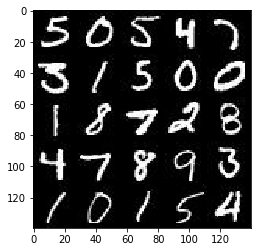

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

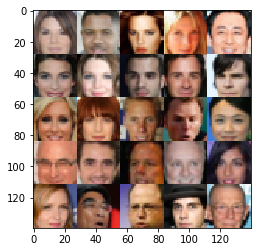

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [10]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """

    input_images = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name='input_images')
    z_input = tf.placeholder(tf.float32, [None, z_dim], name='z_input')
    l_rate = tf.placeholder(tf.float32, name='learning_rate')
    
    return input_images, z_input, l_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [11]:
def discriminator(images, reuse=False, alpha=0.2, keep_prob=0.8):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        #image is 28x28x3        
        
        #Tried first without the xavier initialization. It seems to perform OK without it
        #Added Xavier initialization since in my other GAN exercises leaving the default 
        #caused erratic runs and difficulty when converging
        
        #First Convolution
        conv1 = tf.layers.conv2d(images, 128, 5, 2, padding='same', 
                                 kernel_initializer=tf.contrib.layers.xavier_initializer())
        relu1 = tf.maximum(alpha * conv1, conv1)
        #14x14x64
        
        #Second Convolution
        conv2 = tf.layers.conv2d(relu1, 256, 5, 2, padding='same', 
                                 kernel_initializer=tf.contrib.layers.xavier_initializer())
        batch2 = tf.layers.batch_normalization(conv2, training=True)
        relu2 = tf.maximum(alpha * batch2, batch2)
        #7x7x128
        
        #Third Convolution
        conv3 = tf.layers.conv2d(relu2, 512, 5, 2, padding='same', 
                                 kernel_initializer=tf.contrib.layers.xavier_initializer())
        batch3 = tf.layers.batch_normalization(conv3, training=True)
        relu3 = tf.maximum(alpha * batch3, batch3)   
        drop3 = tf.nn.dropout(relu3, keep_prob)
        #4x4x256
        
        flat = tf.reshape(drop3, (-1, 4*4*512))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [12]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2, keep_prob=0.8):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=not is_train):
        dense = tf.layers.dense(z, 7*7*512)
        
        # Reshape it to start convolutionals
        conv1 = tf.reshape(dense, (-1, 7, 7, 512))
        batch1 = tf.layers.batch_normalization(conv1, training=is_train)
        relu1 = tf.maximum(alpha * batch1, batch1)
        drop1 = tf.nn.dropout(relu1, keep_prob)
        # 7x7x512
        
        #Second Conv
        conv2 = tf.layers.conv2d_transpose(drop1, 256, 5, strides=2, padding='same', 
                                           kernel_initializer=tf.contrib.layers.xavier_initializer())
        batch2 = tf.layers.batch_normalization(conv2, training=is_train)
        relu2 = tf.maximum(alpha * batch2, batch2)
        # 14x14x256
        
        #Third Conv
        conv3 = tf.layers.conv2d_transpose(relu2, 128, 5, strides=2, padding='same', 
                                           kernel_initializer=tf.contrib.layers.xavier_initializer())
        batch3 = tf.layers.batch_normalization(conv3, training=is_train)
        relu3 = tf.maximum(alpha * batch3, batch3)
        # 28x28x256
        
        # Output layer
        logits = tf.layers.conv2d_transpose(relu3, out_channel_dim, 5, strides=1, padding='same', 
                                            kernel_initializer=tf.contrib.layers.xavier_initializer())
        # 28x28x3
        
        output = tf.tanh(logits)   
    
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [13]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2, smooth=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * (1.-smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
     
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [14]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [15]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [16]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode, print_every=25, show_every=100):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    #saver = tf.train.Saver()
    
    #print(data_shape)
    img_w = data_shape[1]
    img_h = data_shape[2]
    img_channels = data_shape[3]
      
    input_real, input_z, l_rate = model_inputs(img_w, img_h, img_channels, z_dim)      
    d_loss, g_loss = model_loss(input_real, input_z, img_channels, alpha=0.02)        
    d_opt, g_opt = model_opt(d_loss, g_loss, l_rate, beta1)
    
    loss_d, loss_g = [], []
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            steps = 0
            for batch_images in get_batches(batch_size):
                
                steps += 1
                batch_images *= 2
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim)).astype(np.float32)
                
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, l_rate:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, l_rate:learning_rate})
                # Second run of Generator to prevent discriminator loss from going to zero.
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, l_rate:learning_rate})
                
                if steps % print_every == 0:                    
                    train_loss_d = d_loss.eval({input_real: batch_images, input_z: batch_z})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    
                    print("Epoch {}/{} ".format(epoch_i+1, epoch_count), 
                          "Batch {} ".format(steps),
                          "Discriminator Loss: {:.4f} ".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                    loss_d.append(train_loss_d)
                    loss_g.append(train_loss_g)
                    
                if steps % show_every == 0:
                    show_generator_output(sess, 25, input_z, img_channels, data_image_mode)
            
            #saver.save(sess, './checkpoints/generator.ckpt')        
        return loss_d, loss_g
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2  Batch 25  Discriminator Loss: 1.1783  Generator Loss: 0.9493
Epoch 1/2  Batch 50  Discriminator Loss: 1.8785  Generator Loss: 0.6544
Epoch 1/2  Batch 75  Discriminator Loss: 1.8456  Generator Loss: 0.3360
Epoch 1/2  Batch 100  Discriminator Loss: 1.8577  Generator Loss: 0.3352


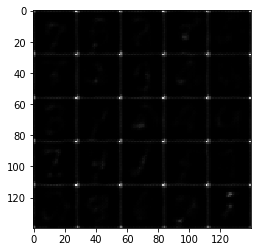

Epoch 1/2  Batch 125  Discriminator Loss: 2.0319  Generator Loss: 0.2707
Epoch 1/2  Batch 150  Discriminator Loss: 1.5954  Generator Loss: 0.5507
Epoch 1/2  Batch 175  Discriminator Loss: 1.7067  Generator Loss: 0.4077
Epoch 1/2  Batch 200  Discriminator Loss: 1.5669  Generator Loss: 0.8342


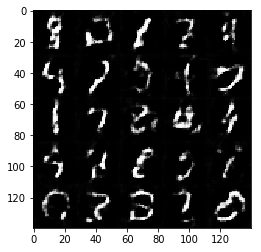

Epoch 1/2  Batch 225  Discriminator Loss: 1.4289  Generator Loss: 0.9730
Epoch 1/2  Batch 250  Discriminator Loss: 1.5947  Generator Loss: 0.5036
Epoch 1/2  Batch 275  Discriminator Loss: 1.4702  Generator Loss: 0.7563
Epoch 1/2  Batch 300  Discriminator Loss: 1.5499  Generator Loss: 0.5834


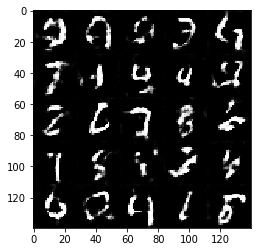

Epoch 1/2  Batch 325  Discriminator Loss: 1.4484  Generator Loss: 1.0946
Epoch 1/2  Batch 350  Discriminator Loss: 1.3793  Generator Loss: 1.0136
Epoch 1/2  Batch 375  Discriminator Loss: 1.4150  Generator Loss: 0.7176
Epoch 1/2  Batch 400  Discriminator Loss: 1.5628  Generator Loss: 0.4614


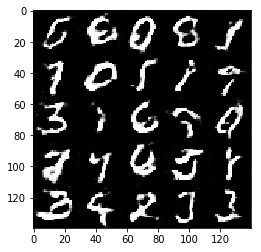

Epoch 1/2  Batch 425  Discriminator Loss: 1.5626  Generator Loss: 1.0900
Epoch 1/2  Batch 450  Discriminator Loss: 1.3981  Generator Loss: 0.5962
Epoch 1/2  Batch 475  Discriminator Loss: 1.5902  Generator Loss: 0.5037
Epoch 1/2  Batch 500  Discriminator Loss: 1.6889  Generator Loss: 0.3766


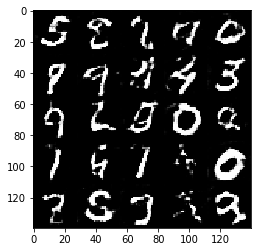

Epoch 1/2  Batch 525  Discriminator Loss: 1.9038  Generator Loss: 1.6004
Epoch 1/2  Batch 550  Discriminator Loss: 1.4752  Generator Loss: 0.4851
Epoch 1/2  Batch 575  Discriminator Loss: 1.4180  Generator Loss: 0.9506
Epoch 1/2  Batch 600  Discriminator Loss: 1.8425  Generator Loss: 0.3358


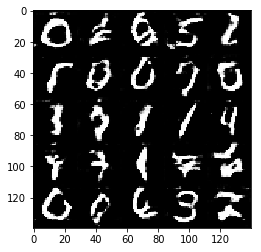

Epoch 1/2  Batch 625  Discriminator Loss: 1.4354  Generator Loss: 0.6132
Epoch 1/2  Batch 650  Discriminator Loss: 2.1498  Generator Loss: 0.2133
Epoch 1/2  Batch 675  Discriminator Loss: 1.4952  Generator Loss: 0.7618
Epoch 1/2  Batch 700  Discriminator Loss: 1.4508  Generator Loss: 0.8239


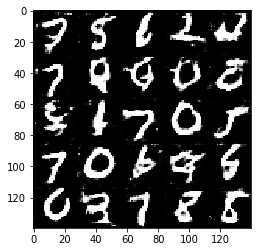

Epoch 1/2  Batch 725  Discriminator Loss: 1.4752  Generator Loss: 0.5755
Epoch 1/2  Batch 750  Discriminator Loss: 1.4217  Generator Loss: 0.6405
Epoch 1/2  Batch 775  Discriminator Loss: 1.4094  Generator Loss: 0.7945
Epoch 1/2  Batch 800  Discriminator Loss: 1.6547  Generator Loss: 0.4039


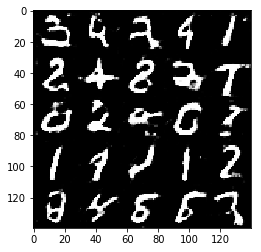

Epoch 1/2  Batch 825  Discriminator Loss: 1.4513  Generator Loss: 0.5455
Epoch 1/2  Batch 850  Discriminator Loss: 1.4262  Generator Loss: 0.6095
Epoch 1/2  Batch 875  Discriminator Loss: 1.4082  Generator Loss: 0.6649
Epoch 1/2  Batch 900  Discriminator Loss: 1.3570  Generator Loss: 0.6989


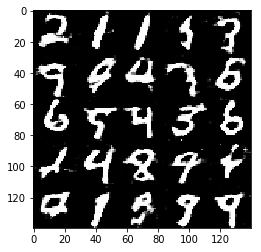

Epoch 1/2  Batch 925  Discriminator Loss: 1.4380  Generator Loss: 0.7426
Epoch 2/2  Batch 25  Discriminator Loss: 1.2591  Generator Loss: 0.9078
Epoch 2/2  Batch 50  Discriminator Loss: 1.2991  Generator Loss: 1.6629
Epoch 2/2  Batch 75  Discriminator Loss: 1.3594  Generator Loss: 0.9390
Epoch 2/2  Batch 100  Discriminator Loss: 1.6044  Generator Loss: 0.3707


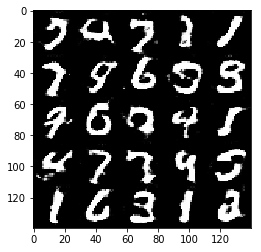

Epoch 2/2  Batch 125  Discriminator Loss: 1.1574  Generator Loss: 0.9250
Epoch 2/2  Batch 150  Discriminator Loss: 1.3096  Generator Loss: 0.6217
Epoch 2/2  Batch 175  Discriminator Loss: 1.3988  Generator Loss: 0.5571
Epoch 2/2  Batch 200  Discriminator Loss: 1.1416  Generator Loss: 0.9100


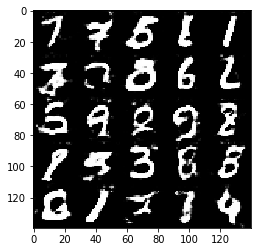

Epoch 2/2  Batch 225  Discriminator Loss: 1.4419  Generator Loss: 0.5953
Epoch 2/2  Batch 250  Discriminator Loss: 1.1780  Generator Loss: 0.7835
Epoch 2/2  Batch 275  Discriminator Loss: 1.5775  Generator Loss: 0.4275
Epoch 2/2  Batch 300  Discriminator Loss: 1.2014  Generator Loss: 0.9885


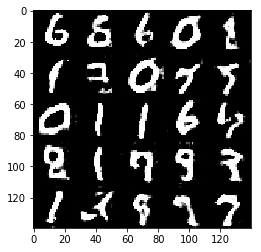

Epoch 2/2  Batch 325  Discriminator Loss: 1.2970  Generator Loss: 0.9822
Epoch 2/2  Batch 350  Discriminator Loss: 1.1411  Generator Loss: 1.1460
Epoch 2/2  Batch 375  Discriminator Loss: 1.4413  Generator Loss: 0.5342
Epoch 2/2  Batch 400  Discriminator Loss: 1.4276  Generator Loss: 1.7819


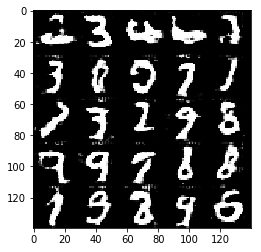

Epoch 2/2  Batch 425  Discriminator Loss: 1.2618  Generator Loss: 0.7586
Epoch 2/2  Batch 450  Discriminator Loss: 1.4026  Generator Loss: 0.5559
Epoch 2/2  Batch 475  Discriminator Loss: 1.3144  Generator Loss: 0.8437
Epoch 2/2  Batch 500  Discriminator Loss: 1.7863  Generator Loss: 0.3424


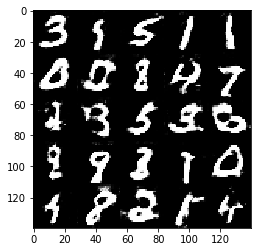

Epoch 2/2  Batch 525  Discriminator Loss: 1.2134  Generator Loss: 0.9472
Epoch 2/2  Batch 550  Discriminator Loss: 1.1208  Generator Loss: 0.9558
Epoch 2/2  Batch 575  Discriminator Loss: 1.3367  Generator Loss: 0.5321
Epoch 2/2  Batch 600  Discriminator Loss: 1.1958  Generator Loss: 1.2305


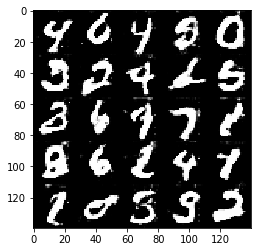

Epoch 2/2  Batch 625  Discriminator Loss: 1.5349  Generator Loss: 0.4046
Epoch 2/2  Batch 650  Discriminator Loss: 1.8738  Generator Loss: 0.3161
Epoch 2/2  Batch 675  Discriminator Loss: 1.5334  Generator Loss: 0.4685
Epoch 2/2  Batch 700  Discriminator Loss: 1.2064  Generator Loss: 0.7114


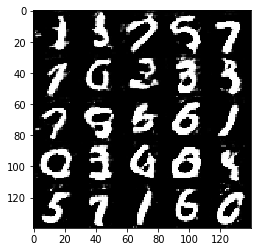

Epoch 2/2  Batch 725  Discriminator Loss: 1.2005  Generator Loss: 1.6365
Epoch 2/2  Batch 750  Discriminator Loss: 1.1829  Generator Loss: 1.2025
Epoch 2/2  Batch 775  Discriminator Loss: 1.1917  Generator Loss: 0.8418
Epoch 2/2  Batch 800  Discriminator Loss: 1.2907  Generator Loss: 0.9149


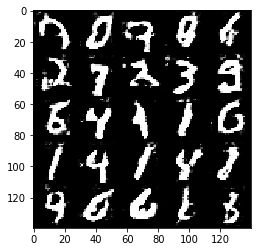

Epoch 2/2  Batch 825  Discriminator Loss: 1.2124  Generator Loss: 0.8543
Epoch 2/2  Batch 850  Discriminator Loss: 1.2558  Generator Loss: 0.7605
Epoch 2/2  Batch 875  Discriminator Loss: 1.4919  Generator Loss: 0.5787
Epoch 2/2  Batch 900  Discriminator Loss: 1.5043  Generator Loss: 0.5831


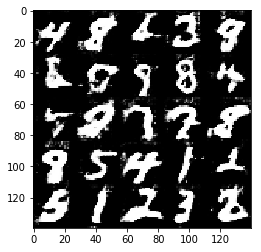

Epoch 2/2  Batch 925  Discriminator Loss: 1.0258  Generator Loss: 0.8839


In [17]:
batch_size = 64
z_dim = 100
learning_rate = 0.0004
beta1 = 0.5 #Same as the DCGAN paper


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/2  Batch 25  Discriminator Loss: 0.7693  Generator Loss: 1.6066
Epoch 1/2  Batch 50  Discriminator Loss: 1.2596  Generator Loss: 0.7912
Epoch 1/2  Batch 75  Discriminator Loss: 1.5807  Generator Loss: 0.7013
Epoch 1/2  Batch 100  Discriminator Loss: 1.5597  Generator Loss: 0.5037


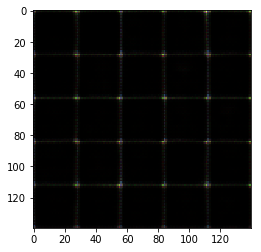

Epoch 1/2  Batch 125  Discriminator Loss: 0.9531  Generator Loss: 1.1105
Epoch 1/2  Batch 150  Discriminator Loss: 1.2003  Generator Loss: 1.2346
Epoch 1/2  Batch 175  Discriminator Loss: 1.3878  Generator Loss: 0.8535
Epoch 1/2  Batch 200  Discriminator Loss: 0.6566  Generator Loss: 2.5746


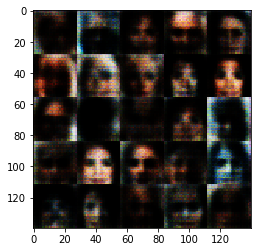

Epoch 1/2  Batch 225  Discriminator Loss: 0.8168  Generator Loss: 1.2033
Epoch 1/2  Batch 250  Discriminator Loss: 1.6213  Generator Loss: 0.5293
Epoch 1/2  Batch 275  Discriminator Loss: 1.0983  Generator Loss: 1.2934
Epoch 1/2  Batch 300  Discriminator Loss: 0.9690  Generator Loss: 2.9197


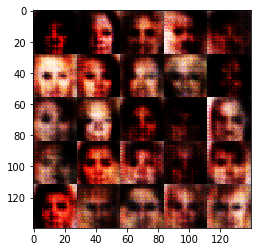

Epoch 1/2  Batch 325  Discriminator Loss: 1.0266  Generator Loss: 1.2698
Epoch 1/2  Batch 350  Discriminator Loss: 1.2771  Generator Loss: 1.1804
Epoch 1/2  Batch 375  Discriminator Loss: 1.4136  Generator Loss: 0.5970
Epoch 1/2  Batch 400  Discriminator Loss: 1.5183  Generator Loss: 0.6356


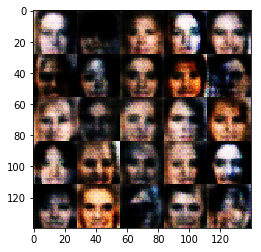

Epoch 1/2  Batch 425  Discriminator Loss: 0.9864  Generator Loss: 1.2608
Epoch 1/2  Batch 450  Discriminator Loss: 2.0022  Generator Loss: 0.2813
Epoch 1/2  Batch 475  Discriminator Loss: 1.6025  Generator Loss: 0.5791
Epoch 1/2  Batch 500  Discriminator Loss: 1.2004  Generator Loss: 0.8816


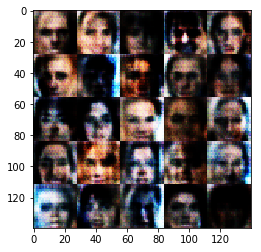

Epoch 1/2  Batch 525  Discriminator Loss: 1.3010  Generator Loss: 0.7692
Epoch 1/2  Batch 550  Discriminator Loss: 1.1698  Generator Loss: 1.4527
Epoch 1/2  Batch 575  Discriminator Loss: 1.1169  Generator Loss: 1.7353
Epoch 1/2  Batch 600  Discriminator Loss: 1.1673  Generator Loss: 0.7306


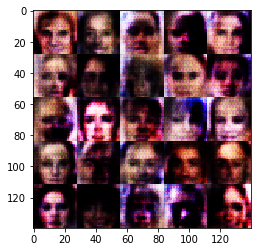

Epoch 1/2  Batch 625  Discriminator Loss: 0.7788  Generator Loss: 2.5772
Epoch 1/2  Batch 650  Discriminator Loss: 1.3211  Generator Loss: 0.7250
Epoch 1/2  Batch 675  Discriminator Loss: 1.0843  Generator Loss: 1.0982
Epoch 1/2  Batch 700  Discriminator Loss: 1.4865  Generator Loss: 1.2394


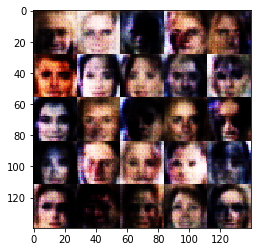

Epoch 1/2  Batch 725  Discriminator Loss: 0.7721  Generator Loss: 4.2690
Epoch 1/2  Batch 750  Discriminator Loss: 0.8113  Generator Loss: 1.4982
Epoch 1/2  Batch 775  Discriminator Loss: 1.1991  Generator Loss: 1.0337
Epoch 1/2  Batch 800  Discriminator Loss: 0.9964  Generator Loss: 1.7935


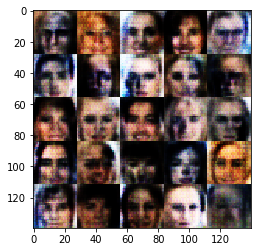

Epoch 1/2  Batch 825  Discriminator Loss: 1.4866  Generator Loss: 0.4558
Epoch 1/2  Batch 850  Discriminator Loss: 1.0189  Generator Loss: 1.4189
Epoch 1/2  Batch 875  Discriminator Loss: 1.4684  Generator Loss: 0.4721
Epoch 1/2  Batch 900  Discriminator Loss: 1.3565  Generator Loss: 0.6761


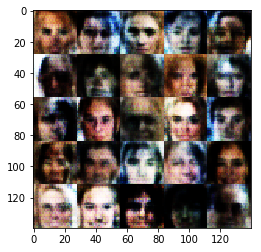

Epoch 1/2  Batch 925  Discriminator Loss: 0.8380  Generator Loss: 1.4156
Epoch 1/2  Batch 950  Discriminator Loss: 1.7348  Generator Loss: 0.3833
Epoch 1/2  Batch 975  Discriminator Loss: 1.0299  Generator Loss: 2.4389
Epoch 1/2  Batch 1000  Discriminator Loss: 1.1280  Generator Loss: 0.8660


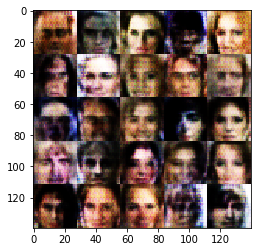

Epoch 1/2  Batch 1025  Discriminator Loss: 1.1340  Generator Loss: 0.9139
Epoch 1/2  Batch 1050  Discriminator Loss: 1.6144  Generator Loss: 0.4319
Epoch 1/2  Batch 1075  Discriminator Loss: 1.3299  Generator Loss: 0.7514
Epoch 1/2  Batch 1100  Discriminator Loss: 1.2197  Generator Loss: 0.7738


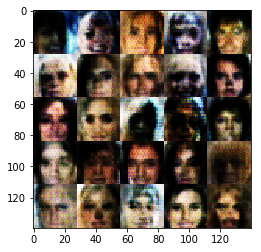

Epoch 1/2  Batch 1125  Discriminator Loss: 0.9349  Generator Loss: 1.3487
Epoch 1/2  Batch 1150  Discriminator Loss: 1.0931  Generator Loss: 1.2818
Epoch 1/2  Batch 1175  Discriminator Loss: 1.2459  Generator Loss: 0.8423
Epoch 1/2  Batch 1200  Discriminator Loss: 1.4032  Generator Loss: 0.5460


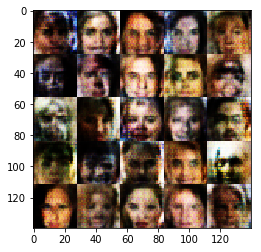

Epoch 1/2  Batch 1225  Discriminator Loss: 1.1503  Generator Loss: 0.8933
Epoch 1/2  Batch 1250  Discriminator Loss: 1.3230  Generator Loss: 0.7151
Epoch 1/2  Batch 1275  Discriminator Loss: 1.3347  Generator Loss: 0.6460
Epoch 1/2  Batch 1300  Discriminator Loss: 1.6931  Generator Loss: 0.3876


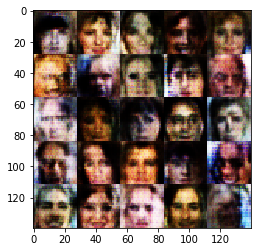

Epoch 1/2  Batch 1325  Discriminator Loss: 0.6486  Generator Loss: 2.1784
Epoch 1/2  Batch 1350  Discriminator Loss: 1.0352  Generator Loss: 0.9603
Epoch 1/2  Batch 1375  Discriminator Loss: 1.1123  Generator Loss: 0.8703
Epoch 1/2  Batch 1400  Discriminator Loss: 1.4491  Generator Loss: 0.5514


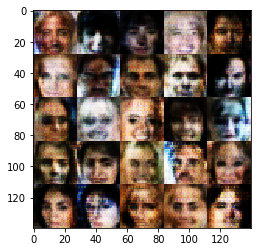

Epoch 1/2  Batch 1425  Discriminator Loss: 1.3965  Generator Loss: 0.5383
Epoch 1/2  Batch 1450  Discriminator Loss: 1.1899  Generator Loss: 0.9713
Epoch 1/2  Batch 1475  Discriminator Loss: 1.8266  Generator Loss: 0.3322
Epoch 1/2  Batch 1500  Discriminator Loss: 1.3876  Generator Loss: 0.6480


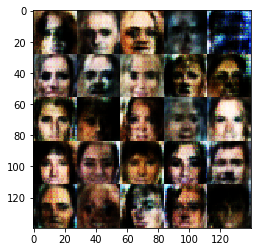

Epoch 1/2  Batch 1525  Discriminator Loss: 1.1485  Generator Loss: 1.0163
Epoch 1/2  Batch 1550  Discriminator Loss: 1.5243  Generator Loss: 0.8924
Epoch 1/2  Batch 1575  Discriminator Loss: 1.1688  Generator Loss: 0.8286
Epoch 1/2  Batch 1600  Discriminator Loss: 0.9681  Generator Loss: 1.0754


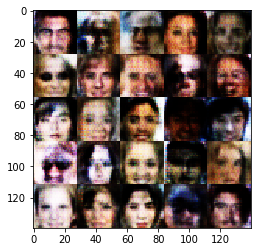

Epoch 1/2  Batch 1625  Discriminator Loss: 1.1743  Generator Loss: 1.0146
Epoch 1/2  Batch 1650  Discriminator Loss: 1.3483  Generator Loss: 0.5373
Epoch 1/2  Batch 1675  Discriminator Loss: 1.2486  Generator Loss: 2.1610
Epoch 1/2  Batch 1700  Discriminator Loss: 1.4112  Generator Loss: 0.6211


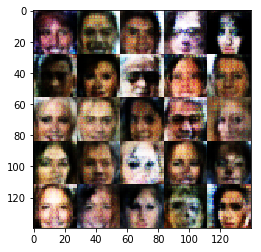

Epoch 1/2  Batch 1725  Discriminator Loss: 0.9632  Generator Loss: 1.2836
Epoch 1/2  Batch 1750  Discriminator Loss: 1.3499  Generator Loss: 0.6695
Epoch 1/2  Batch 1775  Discriminator Loss: 1.3422  Generator Loss: 0.7883
Epoch 1/2  Batch 1800  Discriminator Loss: 1.3461  Generator Loss: 0.5559


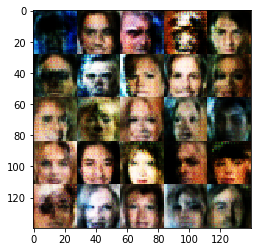

Epoch 1/2  Batch 1825  Discriminator Loss: 1.2564  Generator Loss: 0.6483
Epoch 1/2  Batch 1850  Discriminator Loss: 1.0734  Generator Loss: 1.0204
Epoch 1/2  Batch 1875  Discriminator Loss: 1.5183  Generator Loss: 0.5350
Epoch 1/2  Batch 1900  Discriminator Loss: 1.2901  Generator Loss: 0.6913


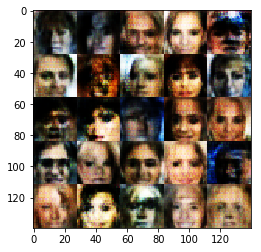

Epoch 1/2  Batch 1925  Discriminator Loss: 1.2168  Generator Loss: 0.9286
Epoch 1/2  Batch 1950  Discriminator Loss: 0.9402  Generator Loss: 1.3161
Epoch 1/2  Batch 1975  Discriminator Loss: 1.1699  Generator Loss: 1.1406
Epoch 1/2  Batch 2000  Discriminator Loss: 1.4113  Generator Loss: 0.6296


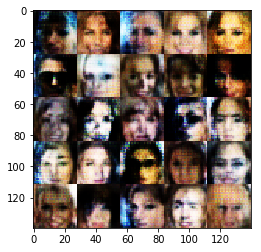

Epoch 1/2  Batch 2025  Discriminator Loss: 0.9943  Generator Loss: 0.9323
Epoch 1/2  Batch 2050  Discriminator Loss: 1.3937  Generator Loss: 0.7225
Epoch 1/2  Batch 2075  Discriminator Loss: 1.0806  Generator Loss: 1.4282
Epoch 1/2  Batch 2100  Discriminator Loss: 0.9157  Generator Loss: 1.6801


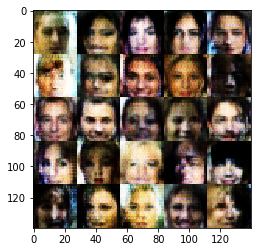

Epoch 1/2  Batch 2125  Discriminator Loss: 1.2898  Generator Loss: 0.7720
Epoch 1/2  Batch 2150  Discriminator Loss: 1.1039  Generator Loss: 1.0182
Epoch 1/2  Batch 2175  Discriminator Loss: 1.5860  Generator Loss: 0.3724
Epoch 1/2  Batch 2200  Discriminator Loss: 1.4898  Generator Loss: 1.0429


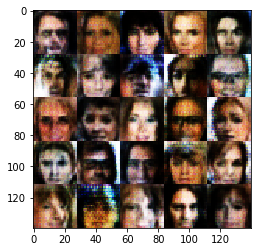

Epoch 1/2  Batch 2225  Discriminator Loss: 1.2680  Generator Loss: 0.7670
Epoch 1/2  Batch 2250  Discriminator Loss: 1.0279  Generator Loss: 1.3909
Epoch 1/2  Batch 2275  Discriminator Loss: 0.8560  Generator Loss: 1.8676
Epoch 1/2  Batch 2300  Discriminator Loss: 1.3841  Generator Loss: 0.5833


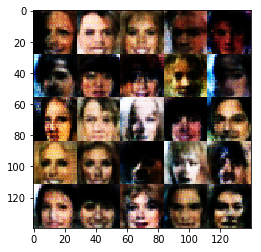

Epoch 1/2  Batch 2325  Discriminator Loss: 1.0662  Generator Loss: 0.8593
Epoch 1/2  Batch 2350  Discriminator Loss: 1.2588  Generator Loss: 1.3222
Epoch 1/2  Batch 2375  Discriminator Loss: 1.0523  Generator Loss: 0.7950
Epoch 1/2  Batch 2400  Discriminator Loss: 1.3350  Generator Loss: 0.5769


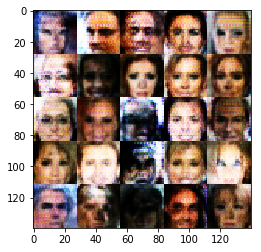

Epoch 1/2  Batch 2425  Discriminator Loss: 0.8791  Generator Loss: 0.9665
Epoch 1/2  Batch 2450  Discriminator Loss: 1.5347  Generator Loss: 0.4633
Epoch 1/2  Batch 2475  Discriminator Loss: 1.6680  Generator Loss: 0.4226
Epoch 1/2  Batch 2500  Discriminator Loss: 1.2871  Generator Loss: 0.7673


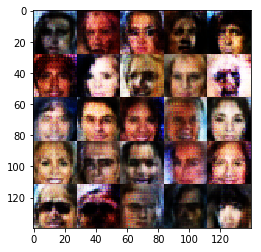

Epoch 1/2  Batch 2525  Discriminator Loss: 1.8909  Generator Loss: 0.3198
Epoch 1/2  Batch 2550  Discriminator Loss: 1.2660  Generator Loss: 0.7495
Epoch 1/2  Batch 2575  Discriminator Loss: 1.6365  Generator Loss: 0.3985
Epoch 1/2  Batch 2600  Discriminator Loss: 1.3307  Generator Loss: 0.7153


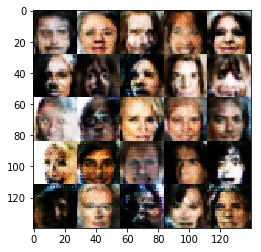

Epoch 1/2  Batch 2625  Discriminator Loss: 1.4553  Generator Loss: 0.4411
Epoch 1/2  Batch 2650  Discriminator Loss: 1.3903  Generator Loss: 0.8004
Epoch 1/2  Batch 2675  Discriminator Loss: 0.8625  Generator Loss: 1.4154
Epoch 1/2  Batch 2700  Discriminator Loss: 1.4728  Generator Loss: 0.4537


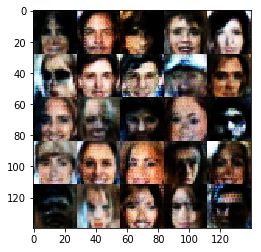

Epoch 1/2  Batch 2725  Discriminator Loss: 1.3569  Generator Loss: 0.7760
Epoch 1/2  Batch 2750  Discriminator Loss: 1.2784  Generator Loss: 0.9616
Epoch 1/2  Batch 2775  Discriminator Loss: 1.1087  Generator Loss: 1.2790
Epoch 1/2  Batch 2800  Discriminator Loss: 1.0448  Generator Loss: 1.4224


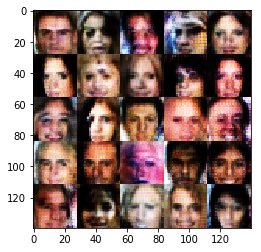

Epoch 1/2  Batch 2825  Discriminator Loss: 1.4953  Generator Loss: 0.4255
Epoch 1/2  Batch 2850  Discriminator Loss: 1.1516  Generator Loss: 1.3511
Epoch 1/2  Batch 2875  Discriminator Loss: 1.6221  Generator Loss: 0.5716
Epoch 1/2  Batch 2900  Discriminator Loss: 1.2340  Generator Loss: 0.5933


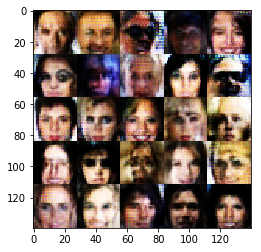

Epoch 1/2  Batch 2925  Discriminator Loss: 1.1027  Generator Loss: 0.7329
Epoch 1/2  Batch 2950  Discriminator Loss: 0.7639  Generator Loss: 1.6114
Epoch 1/2  Batch 2975  Discriminator Loss: 1.2241  Generator Loss: 0.7870
Epoch 1/2  Batch 3000  Discriminator Loss: 0.9943  Generator Loss: 1.1566


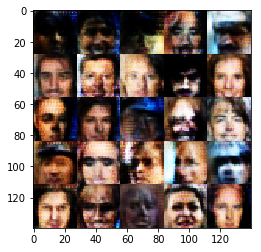

Epoch 1/2  Batch 3025  Discriminator Loss: 1.7259  Generator Loss: 0.4589
Epoch 1/2  Batch 3050  Discriminator Loss: 1.7582  Generator Loss: 0.4678
Epoch 1/2  Batch 3075  Discriminator Loss: 0.9843  Generator Loss: 0.8996
Epoch 1/2  Batch 3100  Discriminator Loss: 1.5112  Generator Loss: 0.4700


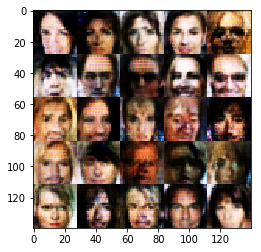

Epoch 1/2  Batch 3125  Discriminator Loss: 1.5454  Generator Loss: 0.5335
Epoch 1/2  Batch 3150  Discriminator Loss: 0.8256  Generator Loss: 1.9097
Epoch 1/2  Batch 3175  Discriminator Loss: 1.1140  Generator Loss: 0.9334
Epoch 1/2  Batch 3200  Discriminator Loss: 1.3952  Generator Loss: 0.5460


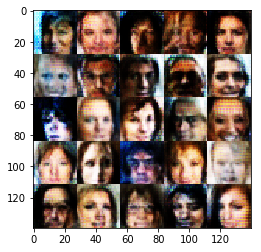

Epoch 1/2  Batch 3225  Discriminator Loss: 1.5528  Generator Loss: 0.5294
Epoch 1/2  Batch 3250  Discriminator Loss: 1.7366  Generator Loss: 0.4432
Epoch 1/2  Batch 3275  Discriminator Loss: 1.0301  Generator Loss: 0.9685
Epoch 1/2  Batch 3300  Discriminator Loss: 1.8594  Generator Loss: 0.3009


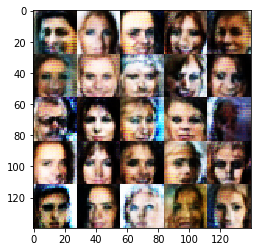

Epoch 1/2  Batch 3325  Discriminator Loss: 1.7043  Generator Loss: 0.3228
Epoch 1/2  Batch 3350  Discriminator Loss: 1.1251  Generator Loss: 0.9772
Epoch 1/2  Batch 3375  Discriminator Loss: 1.7175  Generator Loss: 0.3567
Epoch 1/2  Batch 3400  Discriminator Loss: 1.1081  Generator Loss: 2.1241


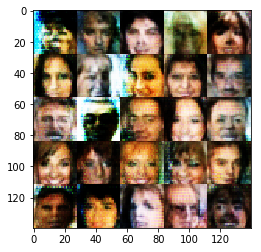

Epoch 1/2  Batch 3425  Discriminator Loss: 1.2219  Generator Loss: 1.0339
Epoch 1/2  Batch 3450  Discriminator Loss: 1.2466  Generator Loss: 0.5967
Epoch 1/2  Batch 3475  Discriminator Loss: 1.6168  Generator Loss: 0.3729
Epoch 1/2  Batch 3500  Discriminator Loss: 1.9145  Generator Loss: 0.3836


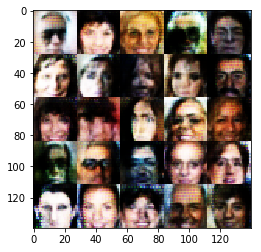

Epoch 1/2  Batch 3525  Discriminator Loss: 1.7474  Generator Loss: 0.4062
Epoch 1/2  Batch 3550  Discriminator Loss: 1.7160  Generator Loss: 0.6167
Epoch 1/2  Batch 3575  Discriminator Loss: 0.6896  Generator Loss: 1.7199
Epoch 1/2  Batch 3600  Discriminator Loss: 1.5041  Generator Loss: 0.5934


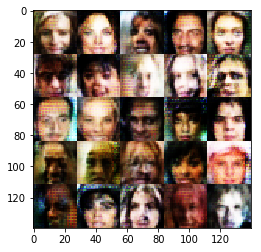

Epoch 1/2  Batch 3625  Discriminator Loss: 1.2363  Generator Loss: 0.6431
Epoch 1/2  Batch 3650  Discriminator Loss: 0.9016  Generator Loss: 1.0610
Epoch 1/2  Batch 3675  Discriminator Loss: 1.3457  Generator Loss: 0.4034
Epoch 1/2  Batch 3700  Discriminator Loss: 1.7613  Generator Loss: 0.2900


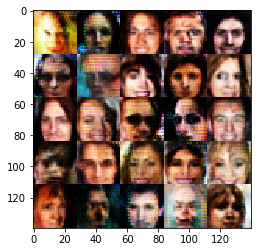

Epoch 1/2  Batch 3725  Discriminator Loss: 1.1393  Generator Loss: 0.9909
Epoch 1/2  Batch 3750  Discriminator Loss: 0.8239  Generator Loss: 1.8324
Epoch 1/2  Batch 3775  Discriminator Loss: 1.3151  Generator Loss: 0.8806
Epoch 1/2  Batch 3800  Discriminator Loss: 1.2328  Generator Loss: 0.8302


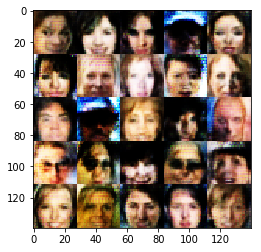

Epoch 1/2  Batch 3825  Discriminator Loss: 1.4475  Generator Loss: 0.7652
Epoch 1/2  Batch 3850  Discriminator Loss: 0.9871  Generator Loss: 1.5337
Epoch 1/2  Batch 3875  Discriminator Loss: 1.3817  Generator Loss: 0.8914
Epoch 1/2  Batch 3900  Discriminator Loss: 1.1383  Generator Loss: 0.8584


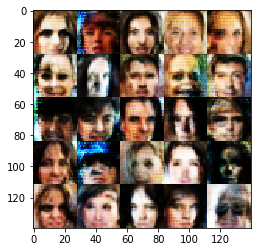

Epoch 1/2  Batch 3925  Discriminator Loss: 0.8912  Generator Loss: 1.9017
Epoch 1/2  Batch 3950  Discriminator Loss: 1.7993  Generator Loss: 0.2802
Epoch 1/2  Batch 3975  Discriminator Loss: 1.3782  Generator Loss: 0.5292
Epoch 1/2  Batch 4000  Discriminator Loss: 1.7635  Generator Loss: 0.3107


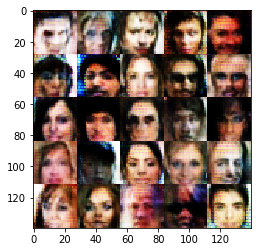

Epoch 1/2  Batch 4025  Discriminator Loss: 1.3079  Generator Loss: 0.6732
Epoch 1/2  Batch 4050  Discriminator Loss: 1.6545  Generator Loss: 0.4744
Epoch 1/2  Batch 4075  Discriminator Loss: 1.1696  Generator Loss: 0.6909
Epoch 1/2  Batch 4100  Discriminator Loss: 1.2250  Generator Loss: 0.8815


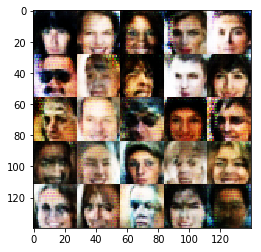

Epoch 1/2  Batch 4125  Discriminator Loss: 1.5854  Generator Loss: 0.4522
Epoch 1/2  Batch 4150  Discriminator Loss: 1.4454  Generator Loss: 0.6083
Epoch 1/2  Batch 4175  Discriminator Loss: 0.9533  Generator Loss: 1.0210
Epoch 1/2  Batch 4200  Discriminator Loss: 1.4032  Generator Loss: 0.5875


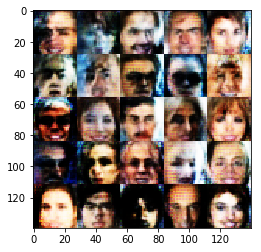

Epoch 1/2  Batch 4225  Discriminator Loss: 1.1985  Generator Loss: 0.8532
Epoch 1/2  Batch 4250  Discriminator Loss: 1.0603  Generator Loss: 0.9033
Epoch 1/2  Batch 4275  Discriminator Loss: 1.1744  Generator Loss: 1.1229
Epoch 1/2  Batch 4300  Discriminator Loss: 1.6913  Generator Loss: 0.3606


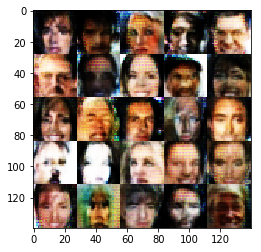

Epoch 1/2  Batch 4325  Discriminator Loss: 1.5412  Generator Loss: 0.5252
Epoch 1/2  Batch 4350  Discriminator Loss: 1.5398  Generator Loss: 0.4396
Epoch 1/2  Batch 4375  Discriminator Loss: 1.0314  Generator Loss: 1.0476
Epoch 1/2  Batch 4400  Discriminator Loss: 0.9846  Generator Loss: 1.2259


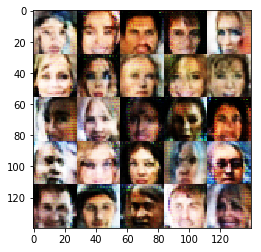

Epoch 1/2  Batch 4425  Discriminator Loss: 0.9690  Generator Loss: 1.2252
Epoch 1/2  Batch 4450  Discriminator Loss: 1.2818  Generator Loss: 0.7154
Epoch 1/2  Batch 4475  Discriminator Loss: 1.0408  Generator Loss: 1.0067
Epoch 1/2  Batch 4500  Discriminator Loss: 1.2376  Generator Loss: 0.7490


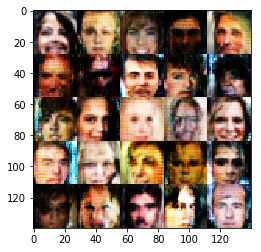

Epoch 1/2  Batch 4525  Discriminator Loss: 1.4760  Generator Loss: 0.4390
Epoch 1/2  Batch 4550  Discriminator Loss: 1.3064  Generator Loss: 1.0039
Epoch 1/2  Batch 4575  Discriminator Loss: 1.8906  Generator Loss: 0.3136
Epoch 1/2  Batch 4600  Discriminator Loss: 1.2953  Generator Loss: 0.8462


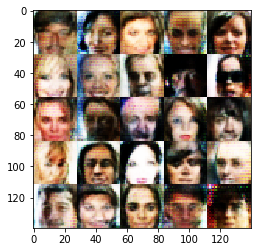

Epoch 1/2  Batch 4625  Discriminator Loss: 0.8469  Generator Loss: 1.3883
Epoch 1/2  Batch 4650  Discriminator Loss: 1.2971  Generator Loss: 0.6842
Epoch 1/2  Batch 4675  Discriminator Loss: 1.0864  Generator Loss: 0.9090
Epoch 1/2  Batch 4700  Discriminator Loss: 1.5697  Generator Loss: 0.4977


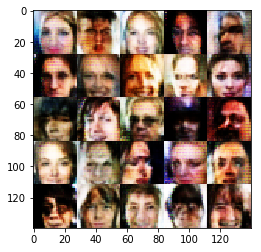

Epoch 1/2  Batch 4725  Discriminator Loss: 1.2924  Generator Loss: 0.5361
Epoch 1/2  Batch 4750  Discriminator Loss: 1.1422  Generator Loss: 1.2193
Epoch 1/2  Batch 4775  Discriminator Loss: 1.2023  Generator Loss: 0.9701
Epoch 1/2  Batch 4800  Discriminator Loss: 1.1319  Generator Loss: 0.9402


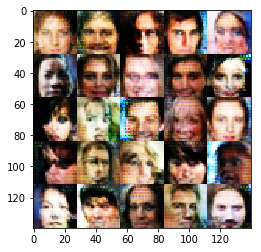

Epoch 1/2  Batch 4825  Discriminator Loss: 1.8584  Generator Loss: 0.3795
Epoch 1/2  Batch 4850  Discriminator Loss: 1.3526  Generator Loss: 0.6209
Epoch 1/2  Batch 4875  Discriminator Loss: 1.1695  Generator Loss: 0.7414
Epoch 1/2  Batch 4900  Discriminator Loss: 1.1830  Generator Loss: 0.9759


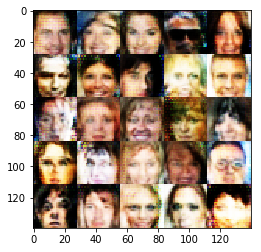

Epoch 1/2  Batch 4925  Discriminator Loss: 1.5370  Generator Loss: 0.8621
Epoch 1/2  Batch 4950  Discriminator Loss: 1.1652  Generator Loss: 0.7829
Epoch 1/2  Batch 4975  Discriminator Loss: 1.0066  Generator Loss: 1.3558
Epoch 1/2  Batch 5000  Discriminator Loss: 1.5420  Generator Loss: 0.4862


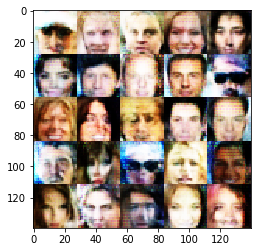

Epoch 1/2  Batch 5025  Discriminator Loss: 1.7822  Generator Loss: 0.3505
Epoch 1/2  Batch 5050  Discriminator Loss: 1.3403  Generator Loss: 0.7646
Epoch 1/2  Batch 5075  Discriminator Loss: 1.4813  Generator Loss: 0.4781
Epoch 1/2  Batch 5100  Discriminator Loss: 1.2104  Generator Loss: 0.8612


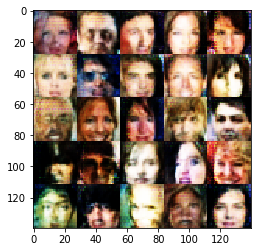

Epoch 1/2  Batch 5125  Discriminator Loss: 0.9716  Generator Loss: 1.1941
Epoch 1/2  Batch 5150  Discriminator Loss: 1.4267  Generator Loss: 0.5724
Epoch 1/2  Batch 5175  Discriminator Loss: 2.1345  Generator Loss: 0.2766
Epoch 1/2  Batch 5200  Discriminator Loss: 1.4665  Generator Loss: 0.6830


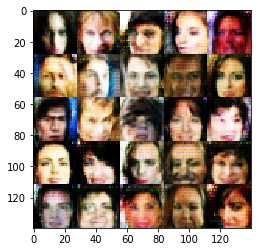

Epoch 1/2  Batch 5225  Discriminator Loss: 0.8186  Generator Loss: 1.5996
Epoch 1/2  Batch 5250  Discriminator Loss: 1.5623  Generator Loss: 0.3900
Epoch 1/2  Batch 5275  Discriminator Loss: 1.2492  Generator Loss: 0.6161
Epoch 1/2  Batch 5300  Discriminator Loss: 1.0101  Generator Loss: 1.9385


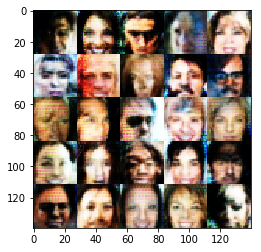

Epoch 1/2  Batch 5325  Discriminator Loss: 1.2692  Generator Loss: 0.7130
Epoch 1/2  Batch 5350  Discriminator Loss: 1.3457  Generator Loss: 0.6473
Epoch 1/2  Batch 5375  Discriminator Loss: 0.8191  Generator Loss: 1.5417
Epoch 1/2  Batch 5400  Discriminator Loss: 1.1166  Generator Loss: 0.6901


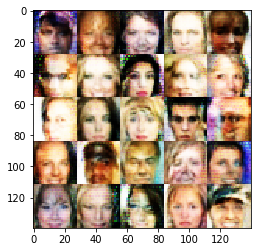

Epoch 1/2  Batch 5425  Discriminator Loss: 1.8079  Generator Loss: 0.4492
Epoch 1/2  Batch 5450  Discriminator Loss: 1.3198  Generator Loss: 0.6266
Epoch 1/2  Batch 5475  Discriminator Loss: 1.9786  Generator Loss: 0.3394
Epoch 1/2  Batch 5500  Discriminator Loss: 1.2649  Generator Loss: 0.8097


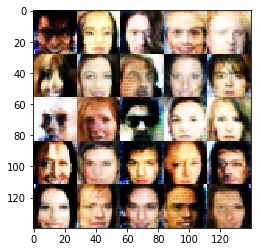

Epoch 1/2  Batch 5525  Discriminator Loss: 1.2250  Generator Loss: 1.6379
Epoch 1/2  Batch 5550  Discriminator Loss: 1.2806  Generator Loss: 0.8979
Epoch 1/2  Batch 5575  Discriminator Loss: 1.4527  Generator Loss: 0.5973
Epoch 1/2  Batch 5600  Discriminator Loss: 1.0988  Generator Loss: 1.2237


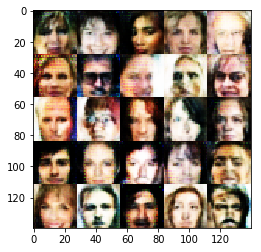

Epoch 1/2  Batch 5625  Discriminator Loss: 1.5296  Generator Loss: 0.5812
Epoch 1/2  Batch 5650  Discriminator Loss: 1.6994  Generator Loss: 0.3743
Epoch 1/2  Batch 5675  Discriminator Loss: 1.7527  Generator Loss: 0.3517
Epoch 1/2  Batch 5700  Discriminator Loss: 1.2523  Generator Loss: 0.6528


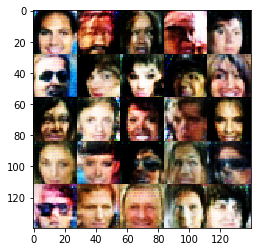

Epoch 1/2  Batch 5725  Discriminator Loss: 1.3569  Generator Loss: 0.7220
Epoch 1/2  Batch 5750  Discriminator Loss: 1.1841  Generator Loss: 0.7983
Epoch 1/2  Batch 5775  Discriminator Loss: 1.4217  Generator Loss: 0.7587
Epoch 1/2  Batch 5800  Discriminator Loss: 1.5941  Generator Loss: 0.4131


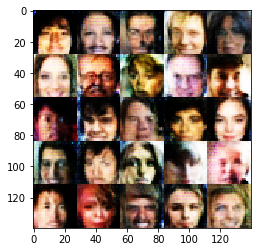

Epoch 1/2  Batch 5825  Discriminator Loss: 2.2035  Generator Loss: 0.2291
Epoch 1/2  Batch 5850  Discriminator Loss: 0.9314  Generator Loss: 0.9532
Epoch 1/2  Batch 5875  Discriminator Loss: 1.8700  Generator Loss: 0.3289
Epoch 1/2  Batch 5900  Discriminator Loss: 1.4003  Generator Loss: 0.4972


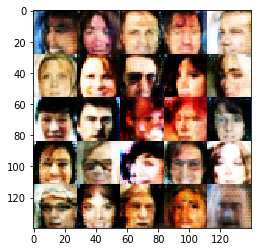

Epoch 1/2  Batch 5925  Discriminator Loss: 0.9390  Generator Loss: 1.3988
Epoch 1/2  Batch 5950  Discriminator Loss: 0.7114  Generator Loss: 1.8144
Epoch 1/2  Batch 5975  Discriminator Loss: 1.5052  Generator Loss: 0.3763
Epoch 1/2  Batch 6000  Discriminator Loss: 1.2437  Generator Loss: 0.8300


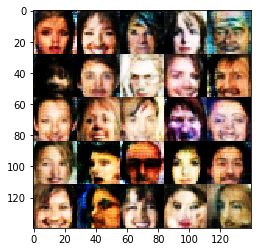

Epoch 1/2  Batch 6025  Discriminator Loss: 1.4629  Generator Loss: 0.5569
Epoch 1/2  Batch 6050  Discriminator Loss: 1.4282  Generator Loss: 0.5678
Epoch 1/2  Batch 6075  Discriminator Loss: 1.2979  Generator Loss: 0.6898
Epoch 1/2  Batch 6100  Discriminator Loss: 1.7759  Generator Loss: 0.4238


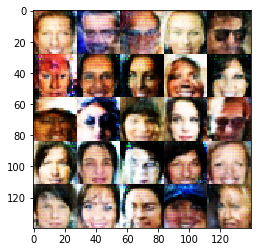

Epoch 1/2  Batch 6125  Discriminator Loss: 1.5930  Generator Loss: 0.8804
Epoch 1/2  Batch 6150  Discriminator Loss: 1.3407  Generator Loss: 0.5848
Epoch 1/2  Batch 6175  Discriminator Loss: 1.6809  Generator Loss: 0.3522
Epoch 1/2  Batch 6200  Discriminator Loss: 1.3784  Generator Loss: 0.6659


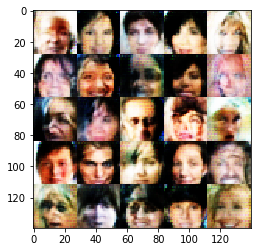

Epoch 1/2  Batch 6225  Discriminator Loss: 1.3947  Generator Loss: 0.5925
Epoch 1/2  Batch 6250  Discriminator Loss: 1.0775  Generator Loss: 1.1704
Epoch 1/2  Batch 6275  Discriminator Loss: 1.3906  Generator Loss: 0.7003
Epoch 1/2  Batch 6300  Discriminator Loss: 1.3591  Generator Loss: 0.8029


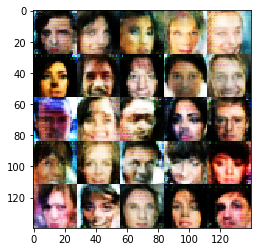

Epoch 1/2  Batch 6325  Discriminator Loss: 1.8399  Generator Loss: 0.3606
Epoch 2/2  Batch 25  Discriminator Loss: 0.7730  Generator Loss: 1.3018
Epoch 2/2  Batch 50  Discriminator Loss: 1.1311  Generator Loss: 0.9657
Epoch 2/2  Batch 75  Discriminator Loss: 1.2390  Generator Loss: 0.8253
Epoch 2/2  Batch 100  Discriminator Loss: 1.4301  Generator Loss: 0.4388


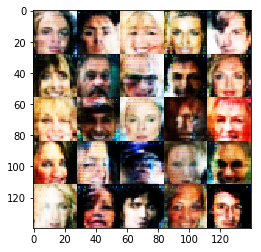

Epoch 2/2  Batch 125  Discriminator Loss: 1.2020  Generator Loss: 0.9427
Epoch 2/2  Batch 150  Discriminator Loss: 1.5582  Generator Loss: 0.5128
Epoch 2/2  Batch 175  Discriminator Loss: 1.3956  Generator Loss: 0.5575
Epoch 2/2  Batch 200  Discriminator Loss: 1.1587  Generator Loss: 0.7721


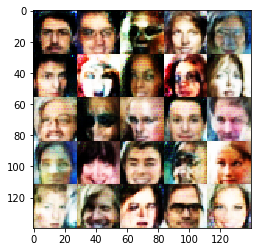

Epoch 2/2  Batch 225  Discriminator Loss: 1.4476  Generator Loss: 0.5980
Epoch 2/2  Batch 250  Discriminator Loss: 1.5028  Generator Loss: 0.6857
Epoch 2/2  Batch 275  Discriminator Loss: 1.0882  Generator Loss: 1.1807
Epoch 2/2  Batch 300  Discriminator Loss: 1.0686  Generator Loss: 0.9639


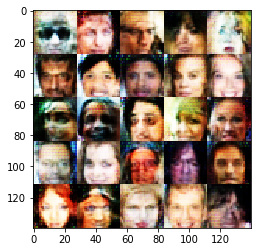

Epoch 2/2  Batch 325  Discriminator Loss: 1.0793  Generator Loss: 0.8729
Epoch 2/2  Batch 350  Discriminator Loss: 1.5126  Generator Loss: 0.4591
Epoch 2/2  Batch 375  Discriminator Loss: 1.6602  Generator Loss: 0.4833
Epoch 2/2  Batch 400  Discriminator Loss: 1.4197  Generator Loss: 0.5484


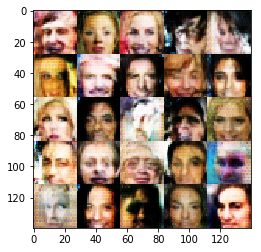

Epoch 2/2  Batch 425  Discriminator Loss: 1.4279  Generator Loss: 0.5548
Epoch 2/2  Batch 450  Discriminator Loss: 1.0925  Generator Loss: 0.9516
Epoch 2/2  Batch 475  Discriminator Loss: 1.0990  Generator Loss: 0.9868
Epoch 2/2  Batch 500  Discriminator Loss: 1.5057  Generator Loss: 0.4578


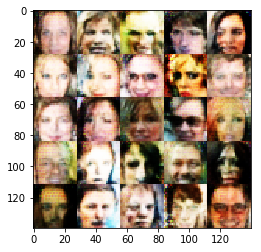

Epoch 2/2  Batch 525  Discriminator Loss: 1.4292  Generator Loss: 0.5895
Epoch 2/2  Batch 550  Discriminator Loss: 1.2792  Generator Loss: 0.7544
Epoch 2/2  Batch 575  Discriminator Loss: 1.3490  Generator Loss: 0.7046
Epoch 2/2  Batch 600  Discriminator Loss: 1.9265  Generator Loss: 0.3667


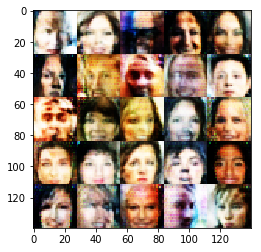

Epoch 2/2  Batch 625  Discriminator Loss: 1.1366  Generator Loss: 0.9258
Epoch 2/2  Batch 650  Discriminator Loss: 1.3155  Generator Loss: 0.7389
Epoch 2/2  Batch 675  Discriminator Loss: 1.2086  Generator Loss: 0.7313
Epoch 2/2  Batch 700  Discriminator Loss: 1.5104  Generator Loss: 0.5417


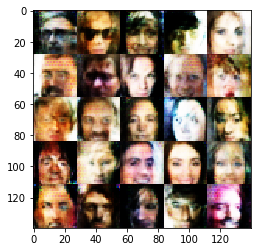

Epoch 2/2  Batch 725  Discriminator Loss: 1.5967  Generator Loss: 0.3750
Epoch 2/2  Batch 750  Discriminator Loss: 1.0814  Generator Loss: 1.9497
Epoch 2/2  Batch 775  Discriminator Loss: 1.6342  Generator Loss: 0.4091
Epoch 2/2  Batch 800  Discriminator Loss: 1.3769  Generator Loss: 0.8108


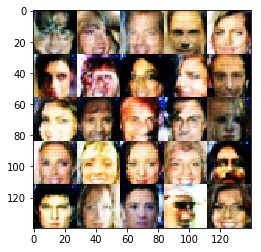

Epoch 2/2  Batch 825  Discriminator Loss: 1.5974  Generator Loss: 0.4003
Epoch 2/2  Batch 850  Discriminator Loss: 1.3053  Generator Loss: 0.6415
Epoch 2/2  Batch 875  Discriminator Loss: 1.4727  Generator Loss: 0.4972
Epoch 2/2  Batch 900  Discriminator Loss: 1.3219  Generator Loss: 0.7861


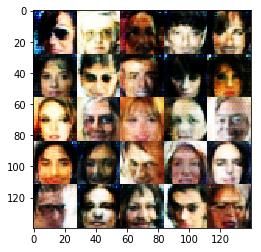

Epoch 2/2  Batch 925  Discriminator Loss: 1.5766  Generator Loss: 0.6468
Epoch 2/2  Batch 950  Discriminator Loss: 1.0903  Generator Loss: 0.7099
Epoch 2/2  Batch 975  Discriminator Loss: 1.3160  Generator Loss: 0.8449
Epoch 2/2  Batch 1000  Discriminator Loss: 1.0939  Generator Loss: 0.8157


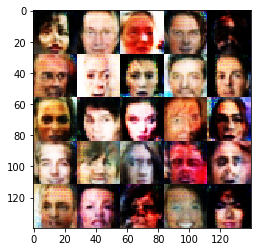

Epoch 2/2  Batch 1025  Discriminator Loss: 1.3292  Generator Loss: 0.5432
Epoch 2/2  Batch 1050  Discriminator Loss: 1.5543  Generator Loss: 0.6368
Epoch 2/2  Batch 1075  Discriminator Loss: 1.1308  Generator Loss: 0.9643
Epoch 2/2  Batch 1100  Discriminator Loss: 1.3983  Generator Loss: 0.5301


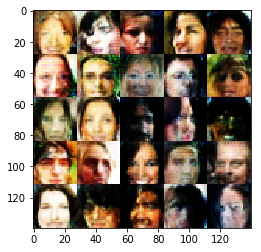

Epoch 2/2  Batch 1125  Discriminator Loss: 1.7645  Generator Loss: 0.5075
Epoch 2/2  Batch 1150  Discriminator Loss: 1.4334  Generator Loss: 0.5070
Epoch 2/2  Batch 1175  Discriminator Loss: 1.5225  Generator Loss: 0.4485
Epoch 2/2  Batch 1200  Discriminator Loss: 1.0125  Generator Loss: 0.9467


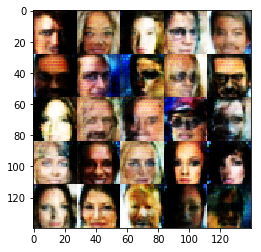

Epoch 2/2  Batch 1225  Discriminator Loss: 1.8493  Generator Loss: 0.5060
Epoch 2/2  Batch 1250  Discriminator Loss: 1.5321  Generator Loss: 0.4770
Epoch 2/2  Batch 1275  Discriminator Loss: 1.0879  Generator Loss: 0.7787
Epoch 2/2  Batch 1300  Discriminator Loss: 2.1653  Generator Loss: 0.2862


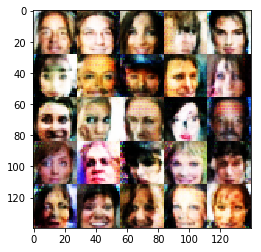

Epoch 2/2  Batch 1325  Discriminator Loss: 1.2197  Generator Loss: 1.0201
Epoch 2/2  Batch 1350  Discriminator Loss: 1.2573  Generator Loss: 0.7559
Epoch 2/2  Batch 1375  Discriminator Loss: 1.4350  Generator Loss: 0.6296
Epoch 2/2  Batch 1400  Discriminator Loss: 1.4805  Generator Loss: 0.5876


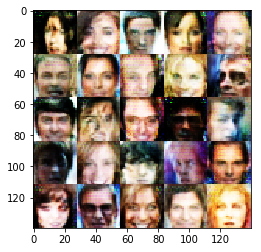

Epoch 2/2  Batch 1425  Discriminator Loss: 1.4024  Generator Loss: 0.6742
Epoch 2/2  Batch 1450  Discriminator Loss: 1.2573  Generator Loss: 0.7038
Epoch 2/2  Batch 1475  Discriminator Loss: 1.0227  Generator Loss: 1.1419
Epoch 2/2  Batch 1500  Discriminator Loss: 1.4289  Generator Loss: 0.7157


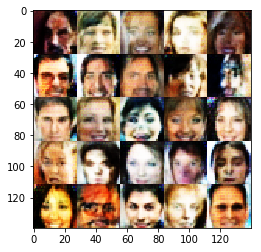

Epoch 2/2  Batch 1525  Discriminator Loss: 1.4231  Generator Loss: 0.8726
Epoch 2/2  Batch 1550  Discriminator Loss: 1.5320  Generator Loss: 0.5600
Epoch 2/2  Batch 1575  Discriminator Loss: 1.1137  Generator Loss: 0.8939
Epoch 2/2  Batch 1600  Discriminator Loss: 0.8881  Generator Loss: 1.5349


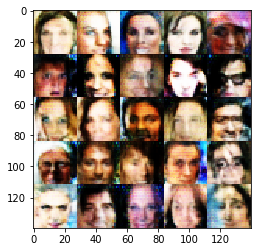

Epoch 2/2  Batch 1625  Discriminator Loss: 1.1888  Generator Loss: 0.5804
Epoch 2/2  Batch 1650  Discriminator Loss: 1.1334  Generator Loss: 1.0296
Epoch 2/2  Batch 1675  Discriminator Loss: 1.3446  Generator Loss: 0.6838
Epoch 2/2  Batch 1700  Discriminator Loss: 1.4851  Generator Loss: 0.4843


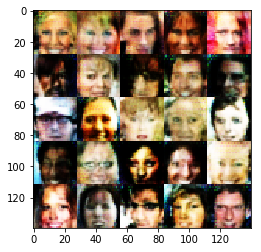

Epoch 2/2  Batch 1725  Discriminator Loss: 1.7332  Generator Loss: 0.3752
Epoch 2/2  Batch 1750  Discriminator Loss: 1.1352  Generator Loss: 1.1978
Epoch 2/2  Batch 1775  Discriminator Loss: 1.3116  Generator Loss: 0.7137
Epoch 2/2  Batch 1800  Discriminator Loss: 1.4330  Generator Loss: 0.4741


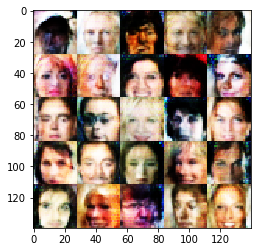

Epoch 2/2  Batch 1825  Discriminator Loss: 1.7271  Generator Loss: 0.4574
Epoch 2/2  Batch 1850  Discriminator Loss: 1.0814  Generator Loss: 0.9257
Epoch 2/2  Batch 1875  Discriminator Loss: 1.1653  Generator Loss: 0.8687
Epoch 2/2  Batch 1900  Discriminator Loss: 1.0472  Generator Loss: 0.9739


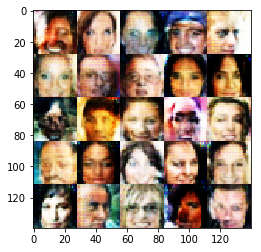

Epoch 2/2  Batch 1925  Discriminator Loss: 1.2560  Generator Loss: 0.6490
Epoch 2/2  Batch 1950  Discriminator Loss: 1.3361  Generator Loss: 0.7126
Epoch 2/2  Batch 1975  Discriminator Loss: 1.4475  Generator Loss: 0.4649
Epoch 2/2  Batch 2000  Discriminator Loss: 1.1532  Generator Loss: 1.1490


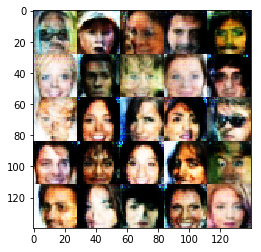

Epoch 2/2  Batch 2025  Discriminator Loss: 1.0709  Generator Loss: 1.0675
Epoch 2/2  Batch 2050  Discriminator Loss: 1.0663  Generator Loss: 0.8166
Epoch 2/2  Batch 2075  Discriminator Loss: 1.2778  Generator Loss: 0.6991
Epoch 2/2  Batch 2100  Discriminator Loss: 1.6054  Generator Loss: 0.5070


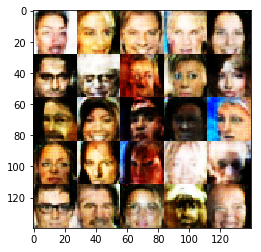

Epoch 2/2  Batch 2125  Discriminator Loss: 1.4559  Generator Loss: 1.0999
Epoch 2/2  Batch 2150  Discriminator Loss: 1.3738  Generator Loss: 0.5896
Epoch 2/2  Batch 2175  Discriminator Loss: 1.9869  Generator Loss: 0.2445
Epoch 2/2  Batch 2200  Discriminator Loss: 1.1373  Generator Loss: 0.8796


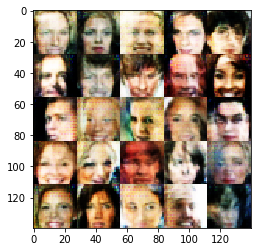

Epoch 2/2  Batch 2225  Discriminator Loss: 3.4237  Generator Loss: 0.0797
Epoch 2/2  Batch 2250  Discriminator Loss: 1.6138  Generator Loss: 0.3664
Epoch 2/2  Batch 2275  Discriminator Loss: 1.1911  Generator Loss: 0.7398
Epoch 2/2  Batch 2300  Discriminator Loss: 1.1583  Generator Loss: 0.7498


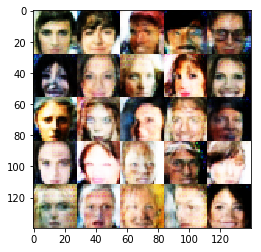

Epoch 2/2  Batch 2325  Discriminator Loss: 1.5079  Generator Loss: 0.5687
Epoch 2/2  Batch 2350  Discriminator Loss: 1.0420  Generator Loss: 1.0631
Epoch 2/2  Batch 2375  Discriminator Loss: 1.3212  Generator Loss: 0.8625
Epoch 2/2  Batch 2400  Discriminator Loss: 1.4753  Generator Loss: 0.5321


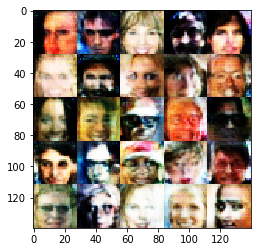

Epoch 2/2  Batch 2425  Discriminator Loss: 1.0461  Generator Loss: 0.8514
Epoch 2/2  Batch 2450  Discriminator Loss: 1.3703  Generator Loss: 0.6865
Epoch 2/2  Batch 2475  Discriminator Loss: 1.3619  Generator Loss: 0.7748
Epoch 2/2  Batch 2500  Discriminator Loss: 1.1689  Generator Loss: 1.1187


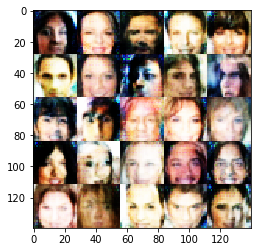

Epoch 2/2  Batch 2525  Discriminator Loss: 1.3927  Generator Loss: 0.5980
Epoch 2/2  Batch 2550  Discriminator Loss: 1.0354  Generator Loss: 0.9667
Epoch 2/2  Batch 2575  Discriminator Loss: 1.2269  Generator Loss: 0.8746
Epoch 2/2  Batch 2600  Discriminator Loss: 1.2448  Generator Loss: 0.6459


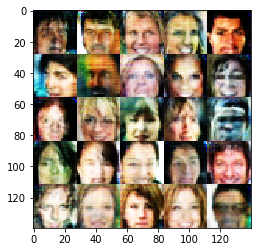

Epoch 2/2  Batch 2625  Discriminator Loss: 1.1381  Generator Loss: 0.9712
Epoch 2/2  Batch 2650  Discriminator Loss: 1.2391  Generator Loss: 0.6516
Epoch 2/2  Batch 2675  Discriminator Loss: 0.9992  Generator Loss: 0.7862
Epoch 2/2  Batch 2700  Discriminator Loss: 1.0856  Generator Loss: 0.7762


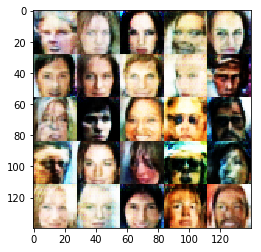

Epoch 2/2  Batch 2725  Discriminator Loss: 1.1798  Generator Loss: 0.8203
Epoch 2/2  Batch 2750  Discriminator Loss: 1.4634  Generator Loss: 0.6797
Epoch 2/2  Batch 2775  Discriminator Loss: 1.1716  Generator Loss: 0.9573
Epoch 2/2  Batch 2800  Discriminator Loss: 1.7663  Generator Loss: 0.6191


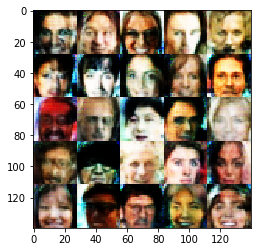

Epoch 2/2  Batch 2825  Discriminator Loss: 1.1922  Generator Loss: 0.6983
Epoch 2/2  Batch 2850  Discriminator Loss: 1.3358  Generator Loss: 0.6373
Epoch 2/2  Batch 2875  Discriminator Loss: 1.3195  Generator Loss: 0.5640
Epoch 2/2  Batch 2900  Discriminator Loss: 1.0662  Generator Loss: 0.8979


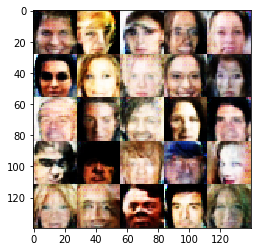

Epoch 2/2  Batch 2925  Discriminator Loss: 1.1005  Generator Loss: 0.8165
Epoch 2/2  Batch 2950  Discriminator Loss: 0.7954  Generator Loss: 1.3267
Epoch 2/2  Batch 2975  Discriminator Loss: 1.1614  Generator Loss: 0.8098
Epoch 2/2  Batch 3000  Discriminator Loss: 1.7768  Generator Loss: 0.4557


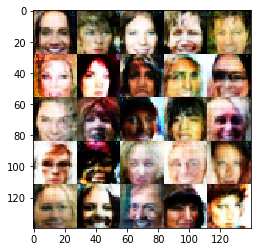

Epoch 2/2  Batch 3025  Discriminator Loss: 0.9768  Generator Loss: 0.9983
Epoch 2/2  Batch 3050  Discriminator Loss: 1.3786  Generator Loss: 0.6199
Epoch 2/2  Batch 3075  Discriminator Loss: 0.9561  Generator Loss: 1.1258
Epoch 2/2  Batch 3100  Discriminator Loss: 1.5079  Generator Loss: 0.5007


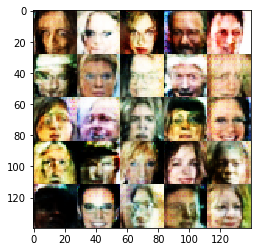

Epoch 2/2  Batch 3125  Discriminator Loss: 1.5050  Generator Loss: 0.5252
Epoch 2/2  Batch 3150  Discriminator Loss: 1.2011  Generator Loss: 0.8910
Epoch 2/2  Batch 3175  Discriminator Loss: 1.6568  Generator Loss: 0.5233
Epoch 2/2  Batch 3200  Discriminator Loss: 1.4479  Generator Loss: 0.6250


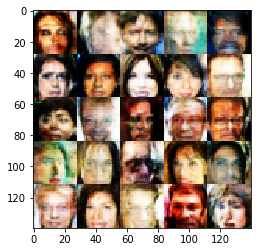

Epoch 2/2  Batch 3225  Discriminator Loss: 1.5554  Generator Loss: 0.4439
Epoch 2/2  Batch 3250  Discriminator Loss: 1.6556  Generator Loss: 0.5085
Epoch 2/2  Batch 3275  Discriminator Loss: 1.2253  Generator Loss: 0.7932
Epoch 2/2  Batch 3300  Discriminator Loss: 1.5024  Generator Loss: 0.6577


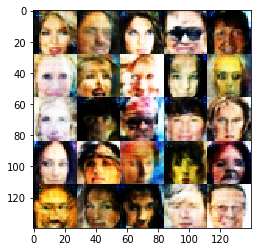

Epoch 2/2  Batch 3325  Discriminator Loss: 1.4275  Generator Loss: 0.6083
Epoch 2/2  Batch 3350  Discriminator Loss: 1.2220  Generator Loss: 0.7659
Epoch 2/2  Batch 3375  Discriminator Loss: 1.2842  Generator Loss: 0.7066
Epoch 2/2  Batch 3400  Discriminator Loss: 1.1812  Generator Loss: 1.0403


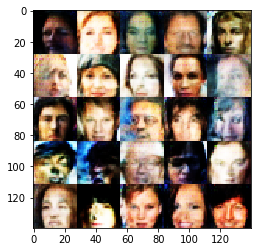

Epoch 2/2  Batch 3425  Discriminator Loss: 1.1839  Generator Loss: 0.8693
Epoch 2/2  Batch 3450  Discriminator Loss: 1.3865  Generator Loss: 0.6846
Epoch 2/2  Batch 3475  Discriminator Loss: 1.3777  Generator Loss: 0.6597
Epoch 2/2  Batch 3500  Discriminator Loss: 1.1241  Generator Loss: 0.9918


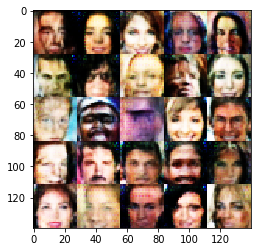

Epoch 2/2  Batch 3525  Discriminator Loss: 1.5209  Generator Loss: 0.5941
Epoch 2/2  Batch 3550  Discriminator Loss: 1.3927  Generator Loss: 0.7805
Epoch 2/2  Batch 3575  Discriminator Loss: 1.0598  Generator Loss: 0.8203
Epoch 2/2  Batch 3600  Discriminator Loss: 1.1483  Generator Loss: 0.8913


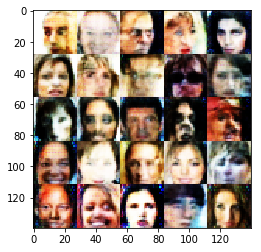

Epoch 2/2  Batch 3625  Discriminator Loss: 0.9612  Generator Loss: 1.4191
Epoch 2/2  Batch 3650  Discriminator Loss: 1.6650  Generator Loss: 0.3806
Epoch 2/2  Batch 3675  Discriminator Loss: 1.3729  Generator Loss: 0.5153
Epoch 2/2  Batch 3700  Discriminator Loss: 1.1047  Generator Loss: 0.8029


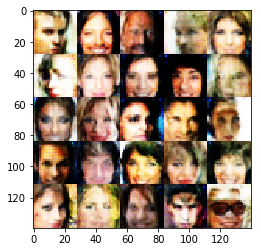

Epoch 2/2  Batch 3725  Discriminator Loss: 0.9148  Generator Loss: 0.9734
Epoch 2/2  Batch 3750  Discriminator Loss: 1.2333  Generator Loss: 0.7834
Epoch 2/2  Batch 3775  Discriminator Loss: 1.3763  Generator Loss: 0.6442
Epoch 2/2  Batch 3800  Discriminator Loss: 1.4555  Generator Loss: 0.8295


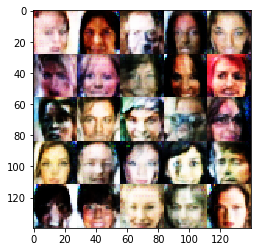

Epoch 2/2  Batch 3825  Discriminator Loss: 0.8521  Generator Loss: 1.3348
Epoch 2/2  Batch 3850  Discriminator Loss: 1.4105  Generator Loss: 0.5671
Epoch 2/2  Batch 3875  Discriminator Loss: 1.1405  Generator Loss: 0.8474
Epoch 2/2  Batch 3900  Discriminator Loss: 1.6374  Generator Loss: 0.4475


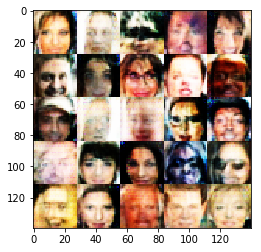

Epoch 2/2  Batch 3925  Discriminator Loss: 1.0980  Generator Loss: 0.9833
Epoch 2/2  Batch 3950  Discriminator Loss: 1.1237  Generator Loss: 0.7552
Epoch 2/2  Batch 3975  Discriminator Loss: 1.2097  Generator Loss: 0.7846
Epoch 2/2  Batch 4000  Discriminator Loss: 1.4393  Generator Loss: 0.6011


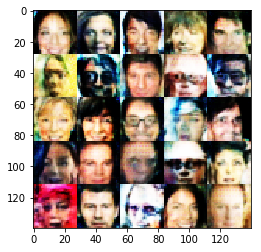

Epoch 2/2  Batch 4025  Discriminator Loss: 1.7550  Generator Loss: 0.4605
Epoch 2/2  Batch 4050  Discriminator Loss: 1.2170  Generator Loss: 0.6713
Epoch 2/2  Batch 4075  Discriminator Loss: 0.9873  Generator Loss: 1.2076
Epoch 2/2  Batch 4100  Discriminator Loss: 1.3516  Generator Loss: 0.6041


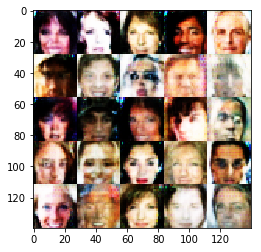

Epoch 2/2  Batch 4125  Discriminator Loss: 1.6359  Generator Loss: 0.3502
Epoch 2/2  Batch 4150  Discriminator Loss: 1.3295  Generator Loss: 0.7197
Epoch 2/2  Batch 4175  Discriminator Loss: 1.0827  Generator Loss: 0.9738
Epoch 2/2  Batch 4200  Discriminator Loss: 1.1614  Generator Loss: 0.8145


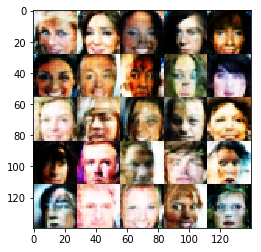

Epoch 2/2  Batch 4225  Discriminator Loss: 1.7237  Generator Loss: 0.4277
Epoch 2/2  Batch 4250  Discriminator Loss: 0.9302  Generator Loss: 1.0614
Epoch 2/2  Batch 4275  Discriminator Loss: 1.1209  Generator Loss: 0.8144
Epoch 2/2  Batch 4300  Discriminator Loss: 1.5747  Generator Loss: 0.5133


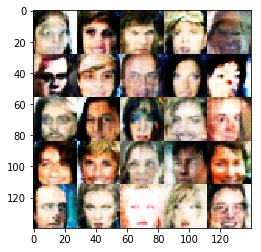

Epoch 2/2  Batch 4325  Discriminator Loss: 1.2173  Generator Loss: 0.5447
Epoch 2/2  Batch 4350  Discriminator Loss: 1.2460  Generator Loss: 0.7057
Epoch 2/2  Batch 4375  Discriminator Loss: 1.1379  Generator Loss: 0.8413
Epoch 2/2  Batch 4400  Discriminator Loss: 1.5329  Generator Loss: 0.5287


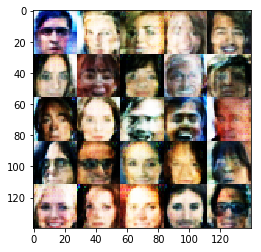

Epoch 2/2  Batch 4425  Discriminator Loss: 1.5028  Generator Loss: 0.5906
Epoch 2/2  Batch 4450  Discriminator Loss: 1.1515  Generator Loss: 0.9020
Epoch 2/2  Batch 4475  Discriminator Loss: 1.5181  Generator Loss: 0.5174
Epoch 2/2  Batch 4500  Discriminator Loss: 1.4915  Generator Loss: 0.4783


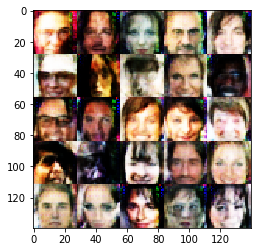

Epoch 2/2  Batch 4525  Discriminator Loss: 1.4403  Generator Loss: 0.4232
Epoch 2/2  Batch 4550  Discriminator Loss: 1.6836  Generator Loss: 0.4620
Epoch 2/2  Batch 4575  Discriminator Loss: 1.0738  Generator Loss: 0.8176
Epoch 2/2  Batch 4600  Discriminator Loss: 2.2884  Generator Loss: 0.2240


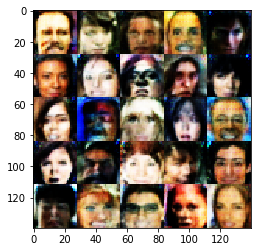

Epoch 2/2  Batch 4625  Discriminator Loss: 0.7419  Generator Loss: 1.5465
Epoch 2/2  Batch 4650  Discriminator Loss: 1.7168  Generator Loss: 0.4567
Epoch 2/2  Batch 4675  Discriminator Loss: 1.6057  Generator Loss: 0.5185
Epoch 2/2  Batch 4700  Discriminator Loss: 1.6508  Generator Loss: 0.6081


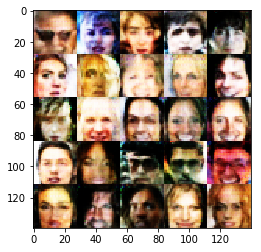

Epoch 2/2  Batch 4725  Discriminator Loss: 1.2514  Generator Loss: 0.7611
Epoch 2/2  Batch 4750  Discriminator Loss: 1.3762  Generator Loss: 0.5902
Epoch 2/2  Batch 4775  Discriminator Loss: 1.6540  Generator Loss: 0.8663
Epoch 2/2  Batch 4800  Discriminator Loss: 1.3379  Generator Loss: 0.6981


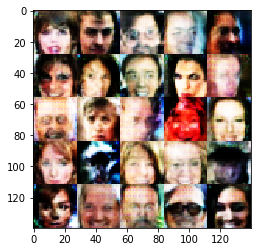

Epoch 2/2  Batch 4825  Discriminator Loss: 1.3986  Generator Loss: 0.6160
Epoch 2/2  Batch 4850  Discriminator Loss: 1.4711  Generator Loss: 0.5243
Epoch 2/2  Batch 4875  Discriminator Loss: 1.1003  Generator Loss: 0.9426
Epoch 2/2  Batch 4900  Discriminator Loss: 1.7586  Generator Loss: 0.4253


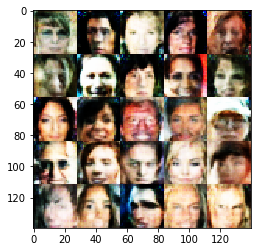

Epoch 2/2  Batch 4925  Discriminator Loss: 1.1601  Generator Loss: 0.8090
Epoch 2/2  Batch 4950  Discriminator Loss: 0.7648  Generator Loss: 1.3934
Epoch 2/2  Batch 4975  Discriminator Loss: 1.6696  Generator Loss: 0.4706
Epoch 2/2  Batch 5000  Discriminator Loss: 1.2957  Generator Loss: 0.6440


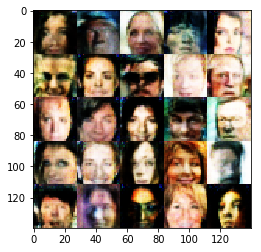

Epoch 2/2  Batch 5025  Discriminator Loss: 1.1562  Generator Loss: 0.7206
Epoch 2/2  Batch 5050  Discriminator Loss: 1.1996  Generator Loss: 0.7329
Epoch 2/2  Batch 5075  Discriminator Loss: 1.1202  Generator Loss: 0.8186
Epoch 2/2  Batch 5100  Discriminator Loss: 1.2689  Generator Loss: 0.7167


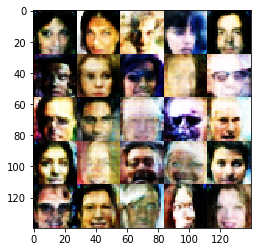

Epoch 2/2  Batch 5125  Discriminator Loss: 1.2549  Generator Loss: 0.9978
Epoch 2/2  Batch 5150  Discriminator Loss: 1.1419  Generator Loss: 0.8403
Epoch 2/2  Batch 5175  Discriminator Loss: 0.9018  Generator Loss: 1.1095
Epoch 2/2  Batch 5200  Discriminator Loss: 0.9241  Generator Loss: 1.0669


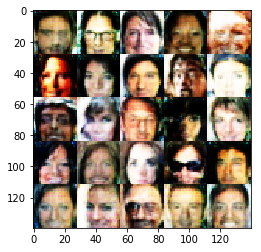

Epoch 2/2  Batch 5225  Discriminator Loss: 1.1003  Generator Loss: 1.0840
Epoch 2/2  Batch 5250  Discriminator Loss: 1.7115  Generator Loss: 0.3598
Epoch 2/2  Batch 5275  Discriminator Loss: 1.0322  Generator Loss: 0.9311
Epoch 2/2  Batch 5300  Discriminator Loss: 1.0991  Generator Loss: 1.0915


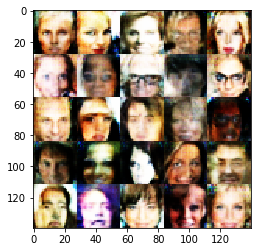

Epoch 2/2  Batch 5325  Discriminator Loss: 1.3533  Generator Loss: 0.6824
Epoch 2/2  Batch 5350  Discriminator Loss: 1.2198  Generator Loss: 0.5346
Epoch 2/2  Batch 5375  Discriminator Loss: 1.3786  Generator Loss: 0.6513
Epoch 2/2  Batch 5400  Discriminator Loss: 1.1215  Generator Loss: 0.8685


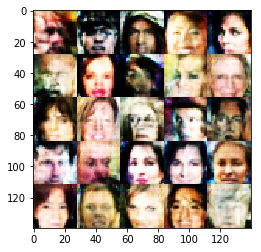

Epoch 2/2  Batch 5425  Discriminator Loss: 1.4718  Generator Loss: 0.5824
Epoch 2/2  Batch 5450  Discriminator Loss: 1.4011  Generator Loss: 0.5509
Epoch 2/2  Batch 5475  Discriminator Loss: 1.5758  Generator Loss: 0.3680
Epoch 2/2  Batch 5500  Discriminator Loss: 1.1636  Generator Loss: 0.8681


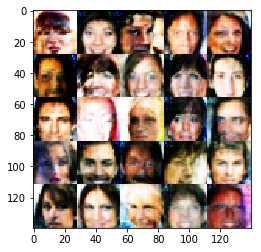

Epoch 2/2  Batch 5525  Discriminator Loss: 1.2177  Generator Loss: 0.6815
Epoch 2/2  Batch 5550  Discriminator Loss: 1.5422  Generator Loss: 0.4723
Epoch 2/2  Batch 5575  Discriminator Loss: 1.3682  Generator Loss: 0.6115
Epoch 2/2  Batch 5600  Discriminator Loss: 1.1114  Generator Loss: 0.8020


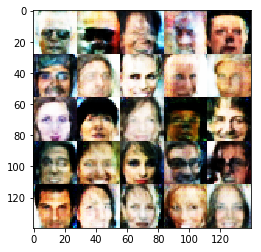

Epoch 2/2  Batch 5625  Discriminator Loss: 1.1360  Generator Loss: 0.9433
Epoch 2/2  Batch 5650  Discriminator Loss: 1.4819  Generator Loss: 0.6525
Epoch 2/2  Batch 5675  Discriminator Loss: 1.2873  Generator Loss: 0.5897
Epoch 2/2  Batch 5700  Discriminator Loss: 1.5997  Generator Loss: 0.6240


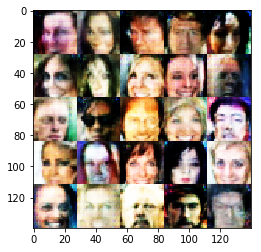

Epoch 2/2  Batch 5725  Discriminator Loss: 1.1756  Generator Loss: 0.9212
Epoch 2/2  Batch 5750  Discriminator Loss: 0.8371  Generator Loss: 0.9836
Epoch 2/2  Batch 5775  Discriminator Loss: 1.2306  Generator Loss: 0.8301
Epoch 2/2  Batch 5800  Discriminator Loss: 2.0217  Generator Loss: 0.2824


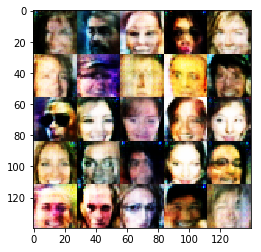

Epoch 2/2  Batch 5825  Discriminator Loss: 1.5965  Generator Loss: 0.4820
Epoch 2/2  Batch 5850  Discriminator Loss: 1.1951  Generator Loss: 0.9273
Epoch 2/2  Batch 5875  Discriminator Loss: 1.5426  Generator Loss: 0.5735
Epoch 2/2  Batch 5900  Discriminator Loss: 1.5666  Generator Loss: 0.3750


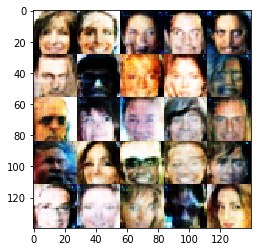

Epoch 2/2  Batch 5925  Discriminator Loss: 1.2804  Generator Loss: 0.9408
Epoch 2/2  Batch 5950  Discriminator Loss: 1.0100  Generator Loss: 0.7649
Epoch 2/2  Batch 5975  Discriminator Loss: 1.3149  Generator Loss: 0.5499
Epoch 2/2  Batch 6000  Discriminator Loss: 1.2783  Generator Loss: 0.6931


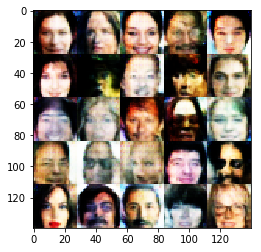

Epoch 2/2  Batch 6025  Discriminator Loss: 1.1204  Generator Loss: 0.9819
Epoch 2/2  Batch 6050  Discriminator Loss: 1.1157  Generator Loss: 0.7765
Epoch 2/2  Batch 6075  Discriminator Loss: 1.4247  Generator Loss: 0.6555
Epoch 2/2  Batch 6100  Discriminator Loss: 1.3409  Generator Loss: 0.6350


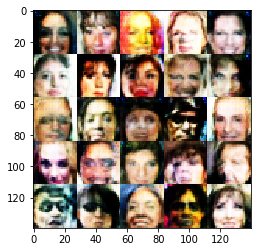

Epoch 2/2  Batch 6125  Discriminator Loss: 1.3591  Generator Loss: 0.6118
Epoch 2/2  Batch 6150  Discriminator Loss: 1.2657  Generator Loss: 0.6800
Epoch 2/2  Batch 6175  Discriminator Loss: 1.2118  Generator Loss: 0.7847
Epoch 2/2  Batch 6200  Discriminator Loss: 1.4585  Generator Loss: 0.5334


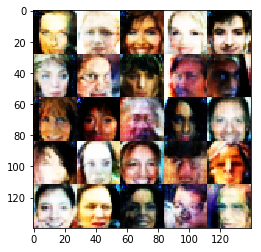

Epoch 2/2  Batch 6225  Discriminator Loss: 1.7055  Generator Loss: 0.4283
Epoch 2/2  Batch 6250  Discriminator Loss: 1.5698  Generator Loss: 0.4685
Epoch 2/2  Batch 6275  Discriminator Loss: 1.7379  Generator Loss: 0.3994
Epoch 2/2  Batch 6300  Discriminator Loss: 1.1868  Generator Loss: 0.8636


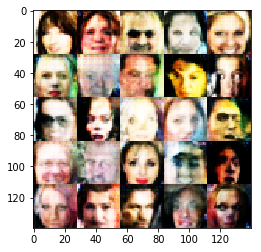

Epoch 2/2  Batch 6325  Discriminator Loss: 1.5028  Generator Loss: 0.4769


In [18]:
batch_size = 32
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.